## Plotting a station choropleth over a region choropleth

In [25]:
import geopandas as gpd
import pandas as pd
import contextily as ctx
import matplotlib.pyplot as plt

In [26]:
gdf = gpd.read_file('acs_11_19_merged_stn+rgn-copy.geojson')

In [27]:
list(gdf['% Change Foreign Born'])

[-5.5694406194697175,
 -4.277400569577999,
 -0.8808613558808853,
 -10.516912806672652,
 2.453619491342429,
 -3.622162288535252,
 -2.2896514853121888,
 -0.8861909595789863,
 -6.164557689859251,
 -0.3415754081779132,
 -8.7530822571036,
 -1.0271590648890605,
 -4.0439641914684685,
 -6.878426769290208,
 -11.238443466386205,
 -8.071816048903525,
 -8.189194278130923,
 -15.220711412239208,
 -9.684103458297011,
 -10.857844184946986,
 -3.6588240662535743,
 -0.893020474377082,
 -8.88951203648529,
 -5.323940092620716,
 -11.63872790345028,
 -12.169810681781678,
 -11.876629478816803,
 -4.948667458063527,
 0.22306780019955008,
 -4.559352097884462,
 -13.512801349124215,
 -8.479533652377564,
 -11.080917524093897,
 -4.162350602558601,
 -1.410156547553948,
 -2.872164147696732,
 -7.2110629213681054,
 -13.048409702235553,
 -12.777058371366657,
 -18.172199530367866,
 -18.19263222885367,
 -1.5025396108776734,
 0.4653178640732558,
 -5.326062081757554,
 -7.298001547377487,
 1.6604081930056025,
 2.3927438125867

In [28]:
gdf.sample(10)

,FIPS,Census Tract,11 Total Population,11 Total Foreign Born,11 Total Entered 2000 or later,11 Europe,11 Europe Entered 2000 or later,11 Asia,11 Asia Entered 2000 or later,11 Latin America,...,19 Other Central America,19 Other Central America Entered 2010 or later,19 South America,19 South America Entered 2010 or later,19 Other Areas,19 Other Areas Entered 2010 or later,% Change Foreign Born,region,station,geometry
189,06037530901,"Census Tract 5309.01, Los Angeles, CA",4158.0,1978.0,428.0,0.0,0.0,9.0,0.0,1969.0,...,302.0,45.0,45.0,0.0,0.0,0.0,-3.787017,East LA,None,"MULTIPOLYGON (((-118.19256 34.04411, -118.1924..."
11,06037183300,"Census Tract 1833, Los Angeles, CA",3334.0,1456.0,248.0,0.0,0.0,506.0,83.0,943.0,...,344.0,42.0,0.0,0.0,19.0,11.0,-1.027159,NELA,None,"MULTIPOLYGON (((-118.20525 34.11930, -118.2050..."
171,06037482522,"Census Tract 4825.22, Los Angeles, CA",4034.0,1435.0,167.0,0.0,0.0,981.0,138.0,447.0,...,189.0,0.0,68.0,0.0,0.0,0.0,6.522053,East LA,None,"MULTIPOLYGON (((-118.10652 34.04040, -118.1058..."
135,06037461501,"Census Tract 4615.01, Los Angeles, CA",3888.0,1268.0,117.0,40.0,0.0,146.0,20.0,1008.0,...,125.0,32.0,27.0,0.0,17.0,7.0,-6.524022,Pasadena,None,"MULTIPOLYGON (((-118.14172 34.18135, -118.1402..."
8,06037183220,"Census Tract 1832.20, Los Angeles, CA",3516.0,1745.0,320.0,55.0,0.0,326.0,43.0,1342.0,...,417.0,30.0,68.0,19.0,18.0,0.0,-6.164558,NELA,None,"MULTIPOLYGON (((-118.19644 34.12039, -118.1964..."
145,06037462202,"Census Tract 4622.02, Los Angeles, CA",3106.0,912.0,624.0,59.0,13.0,733.0,529.0,53.0,...,10.0,0.0,120.0,110.0,65.0,46.0,6.781620,Pasadena,None,"MULTIPOLYGON (((-118.14147 34.14940, -118.1414..."
148,06037462400,"Census Tract 4624, Los Angeles, CA",4251.0,1090.0,219.0,129.0,24.0,455.0,87.0,345.0,...,94.0,0.0,60.0,0.0,22.0,15.0,-2.035549,Pasadena,None,"MULTIPOLYGON (((-118.13250 34.16288, -118.1324..."
78,06037204600,"Census Tract 2046, Los Angeles, CA",4566.0,2412.0,690.0,0.0,0.0,0.0,0.0,2412.0,...,244.0,54.0,21.0,0.0,14.0,14.0,-13.315426,East LA,Mariachi,"MULTIPOLYGON (((-118.22040 34.02978, -118.2203..."
144,06037462201,"Census Tract 4622.01, Los Angeles, CA",4092.0,1487.0,628.0,75.0,0.0,609.0,217.0,762.0,...,80.0,0.0,53.0,0.0,42.0,13.0,-4.773606,Pasadena,None,"MULTIPOLYGON (((-118.14152 34.15780, -118.1413..."
174,06037530005,"Census Tract 5300.05, Los Angeles, CA",4458.0,1900.0,87.0,81.0,0.0,1521.0,70.0,278.0,...,73.0,0.0,18.0,0.0,43.0,0.0,-3.964758,East LA,None,"MULTIPOLYGON (((-118.12508 34.03108, -118.1250..."


In [29]:
gdf_web_mercator = gdf.to_crs(epsg=3857)

In [30]:
def stn_map(region = 'San Gabriel Valley', column = '% Change Foreign Born'):
    
    #this region
    this_region = gdf_web_mercator[gdf_web_mercator['region']==region]
                
    # plot it
    fig,ax = plt.subplots(figsize=(20, 20))
                
    this_region.plot(ax=ax,
                column=column, 
                vmin=-25,
                vmax=25,
                alpha=0.7,
                cmap="RdBu",
                legend=True)
    

#Updating the code so that the loop incorporates the correct station name into the title
    ax.axis('off')
    ax.set_title(region + ' % Change in Foreign Born Population', fontsize=17)
    
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

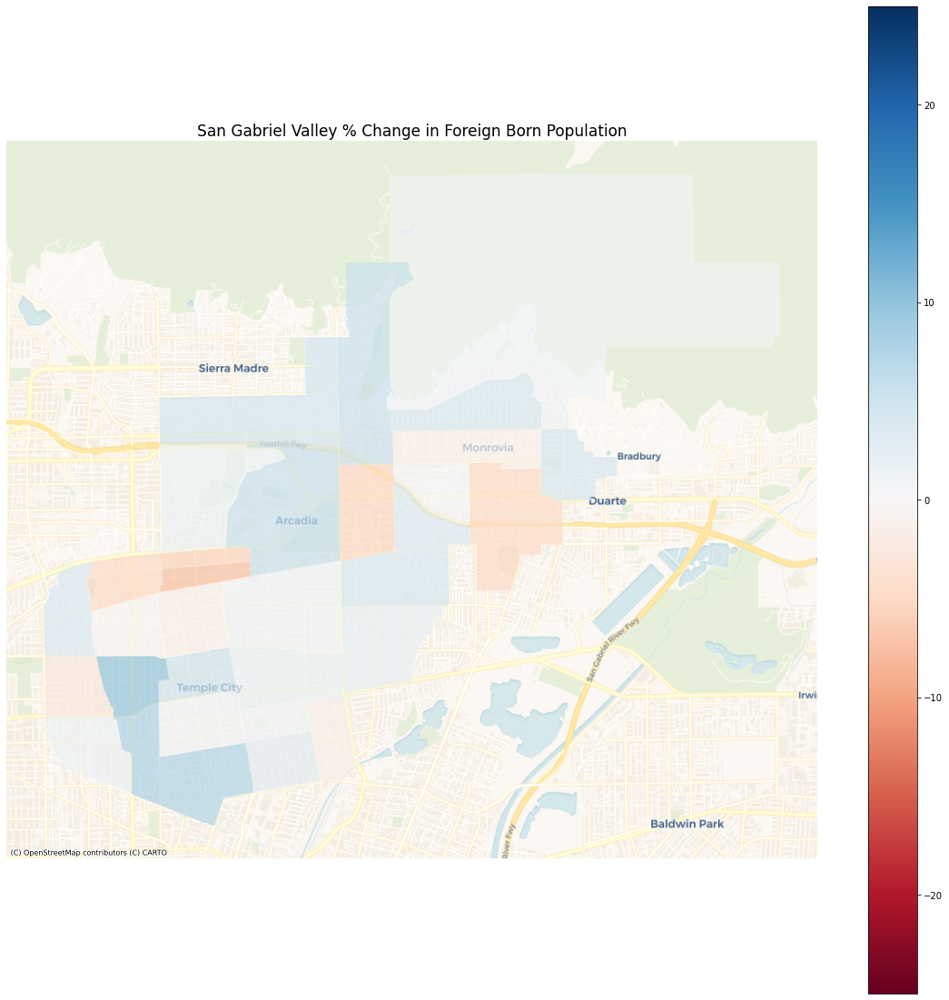

In [31]:
stn_map()

plt.savefig("NSGV_ForeignBorn.jpg")

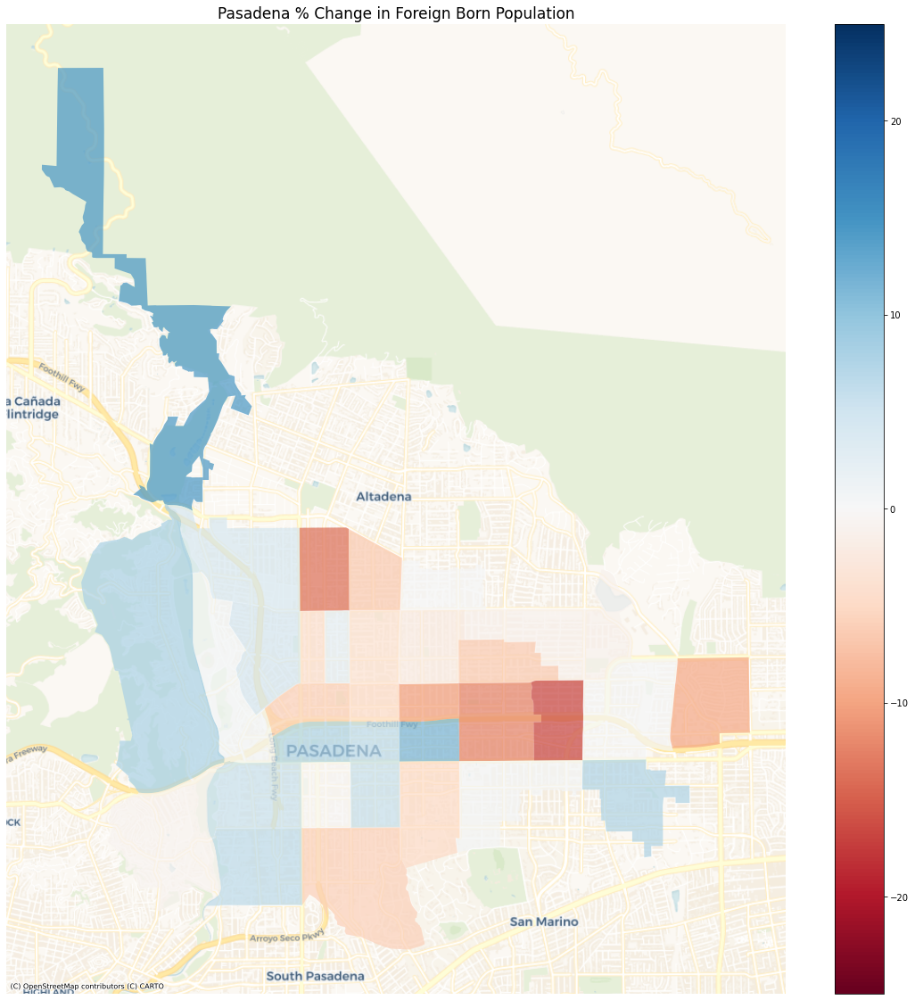

In [32]:
stn_map(region='Pasadena')

plt.savefig("Pasadena_ForeignBorn.jpg")

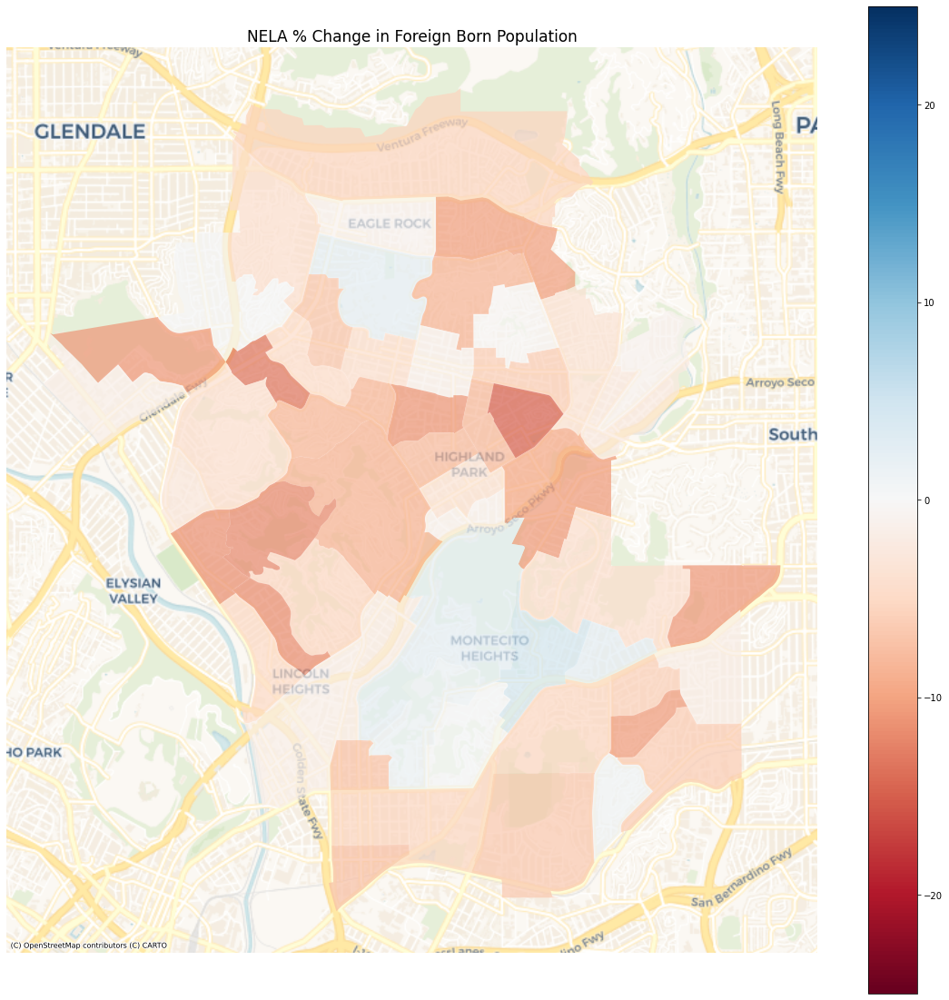

In [33]:
stn_map(region='NELA')

plt.savefig("NELA_ForeignBorn.jpg")

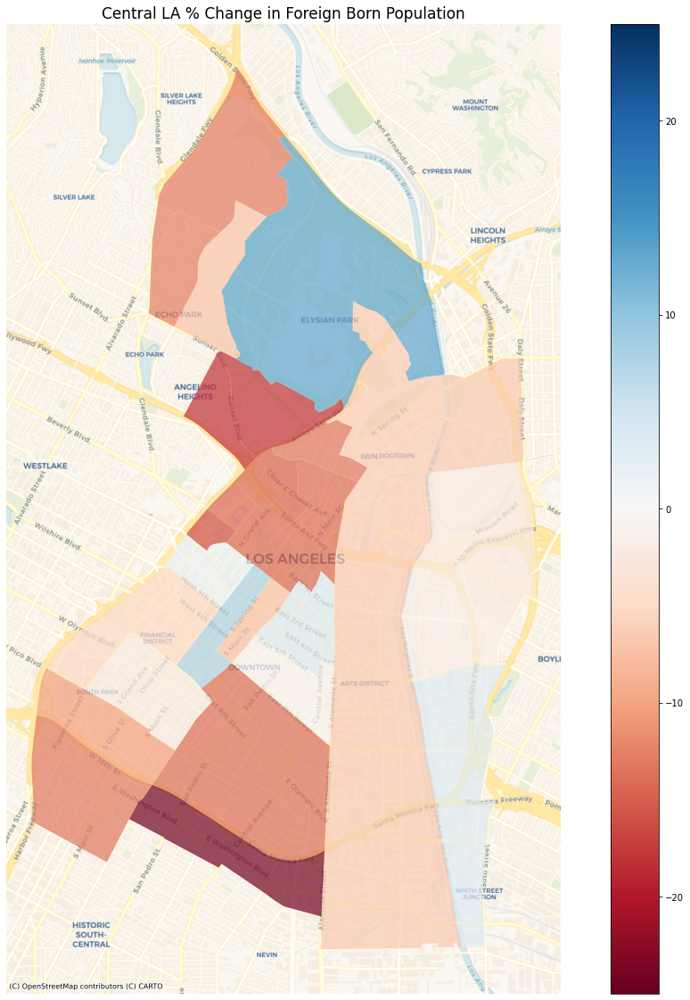

In [34]:
stn_map(region='Central LA')

plt.savefig("Central_LA_ForeignBorn.jpg")

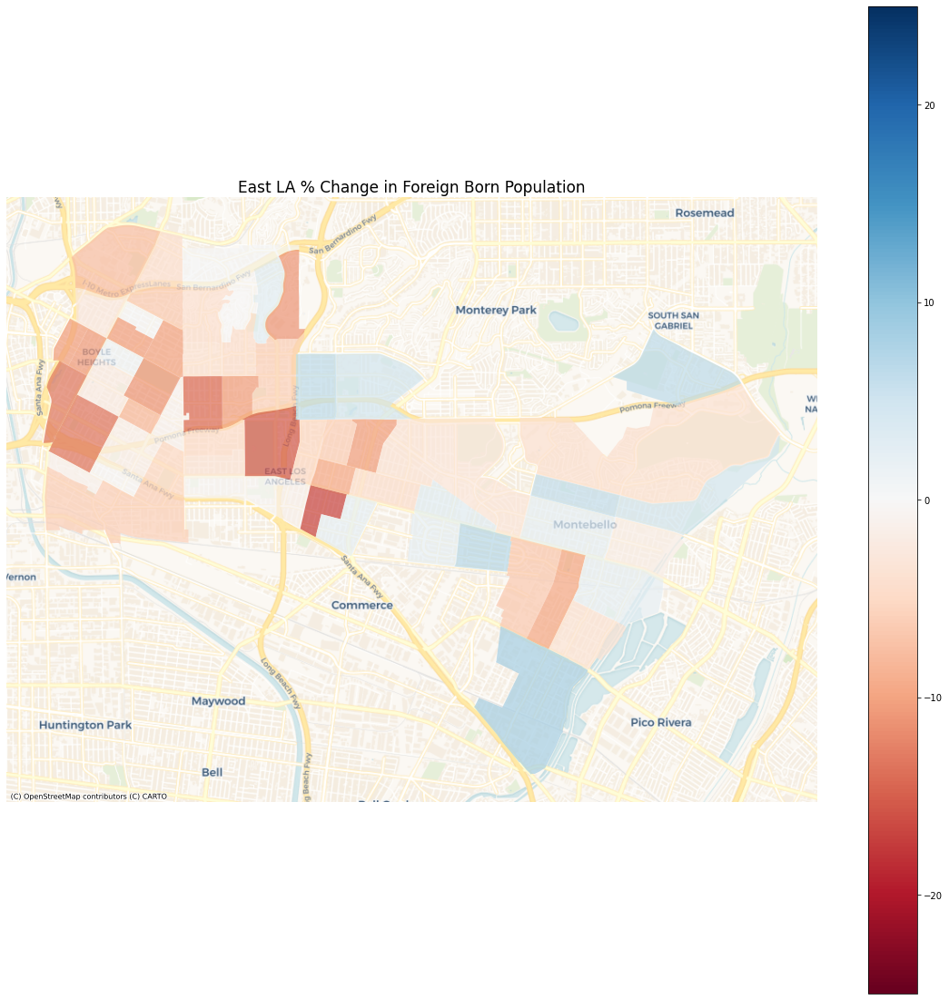

In [35]:
stn_map(region='East LA')

plt.savefig("East_LA_ForeignBorn.jpg")

### Adding the station marker to the region maps

First, let's import the station site lat lons

In [36]:
site = gpd.read_file('Station_lat_lon-copy.csv')

In [37]:
site.head()

,Station,Region,lat,lon,field_5,field_6,field_7,geometry
0,East LA Civic Center Station,East LA,34.0332,-118.1614,,,,None
1,Mariachi Plaza Station,East LA,34.0475,-118.2192,,,",",None
2,Chinatown Station,Central LA,34.0639,-118.2359,,,,None
3,Heritage Square Station,NELA,34.0871,-118.2126,,,,None
4,Highland Park Station,NELA,34.1112,-118.1926,,,,None


Our csv is missing a geometry attribute so we use the existing lat lon in the dataframe to convert it into a geodataframe and activiate the geometry column.

In [38]:
site = gpd.GeoDataFrame(site, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(site.lon, site.lat))

In [39]:
site.head()

,Station,Region,lat,lon,field_5,field_6,field_7,geometry
0,East LA Civic Center Station,East LA,34.0332,-118.1614,,,,POINT (-118.16140 34.03320)
1,Mariachi Plaza Station,East LA,34.0475,-118.2192,,,",",POINT (-118.21920 34.04750)
2,Chinatown Station,Central LA,34.0639,-118.2359,,,,POINT (-118.23590 34.06390)
3,Heritage Square Station,NELA,34.0871,-118.2126,,,,POINT (-118.21260 34.08710)
4,Highland Park Station,NELA,34.1112,-118.1926,,,,POINT (-118.19260 34.11120)


In [40]:
site.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now that we've confirmed that we have a functioning geometry. We project it to web mercator and add it to our function's code.

In [41]:
site_web_mercator = site.to_crs(epsg=3857)

In [42]:
def rgn_map(region = 'San Gabriel Valley', column = '% Change Foreign Born'):
    
    #this region
    this_region = gdf_web_mercator[gdf_web_mercator['region']==region]
                
    # plot it
    fig,ax = plt.subplots(figsize=(20, 20))
                
    this_region.plot(ax=ax,
                column=column, 
                vmin=-25,
                vmax=25,
                alpha=0.7,
                cmap="RdBu",
                legend=True)
    
    # this site
    this_site = site_web_mercator[site_web_mercator['Region']==region]
    
    this_site.plot(ax=ax, 
                   marker='o',
                   markersize=50,
                   color='red')

#Updating the code so that the loop incorporates the correct region name into the title
    ax.axis('off')
    ax.set_title(region + ' % Change in Foreign Born Population (2011-2019)', fontsize=17)
    
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

In [43]:
regions = ['East LA', 'Central LA', 'NELA', 'Pasadena', 'San Gabriel Valley']

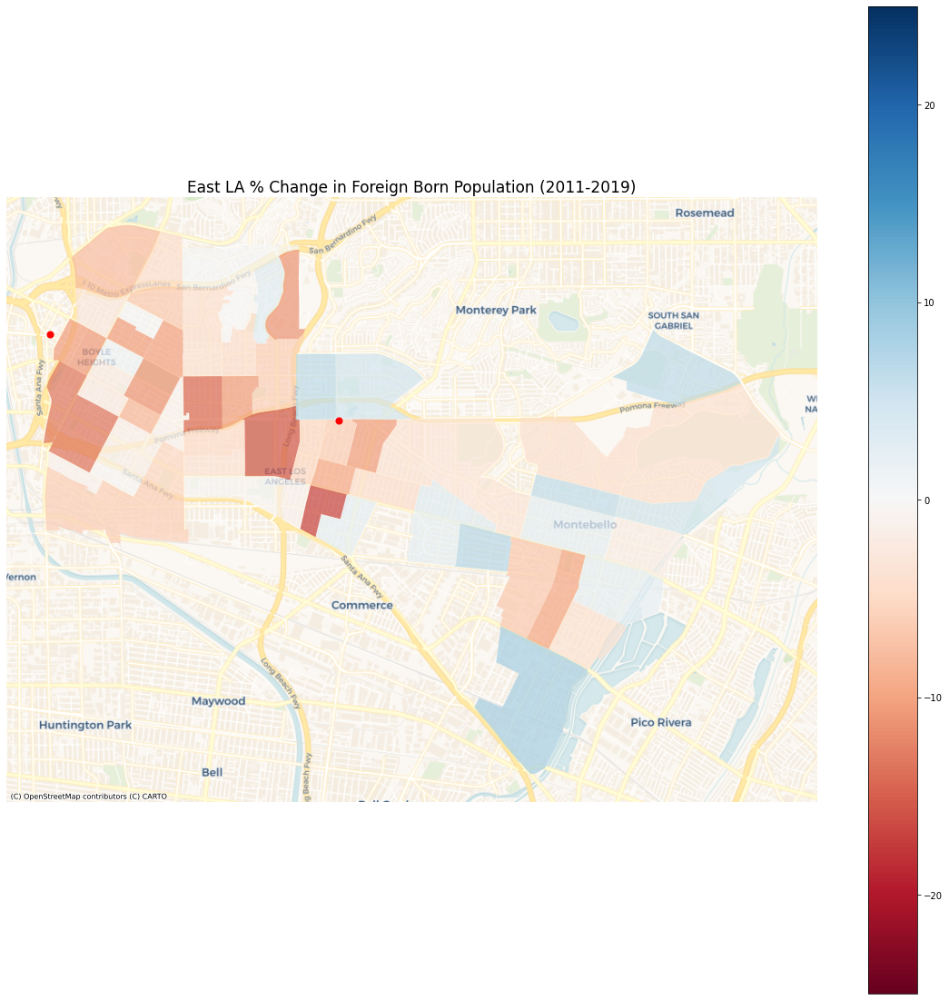

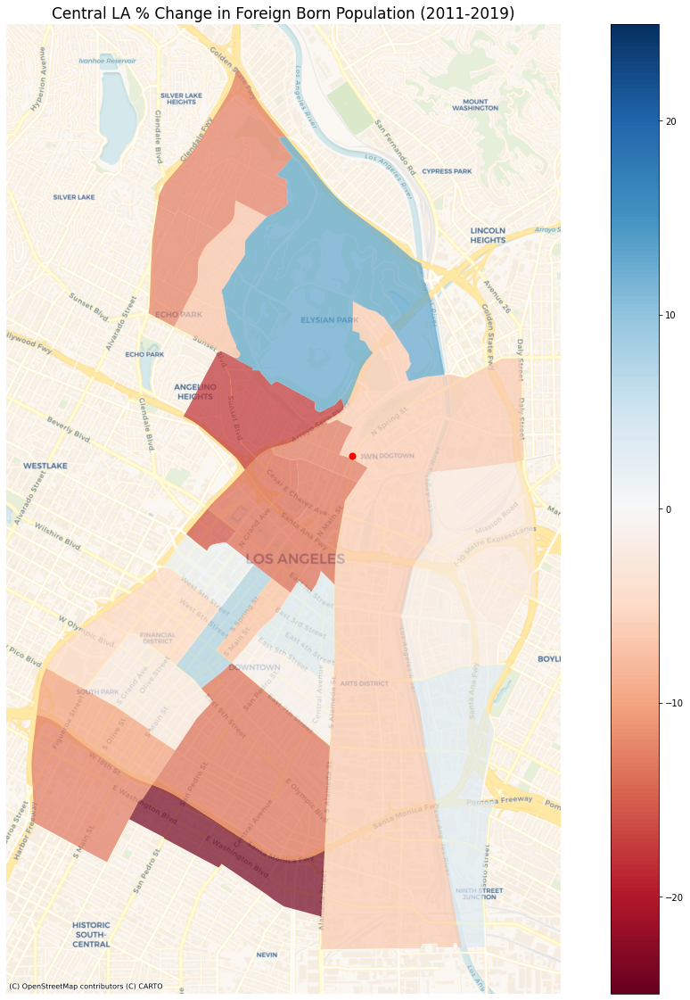

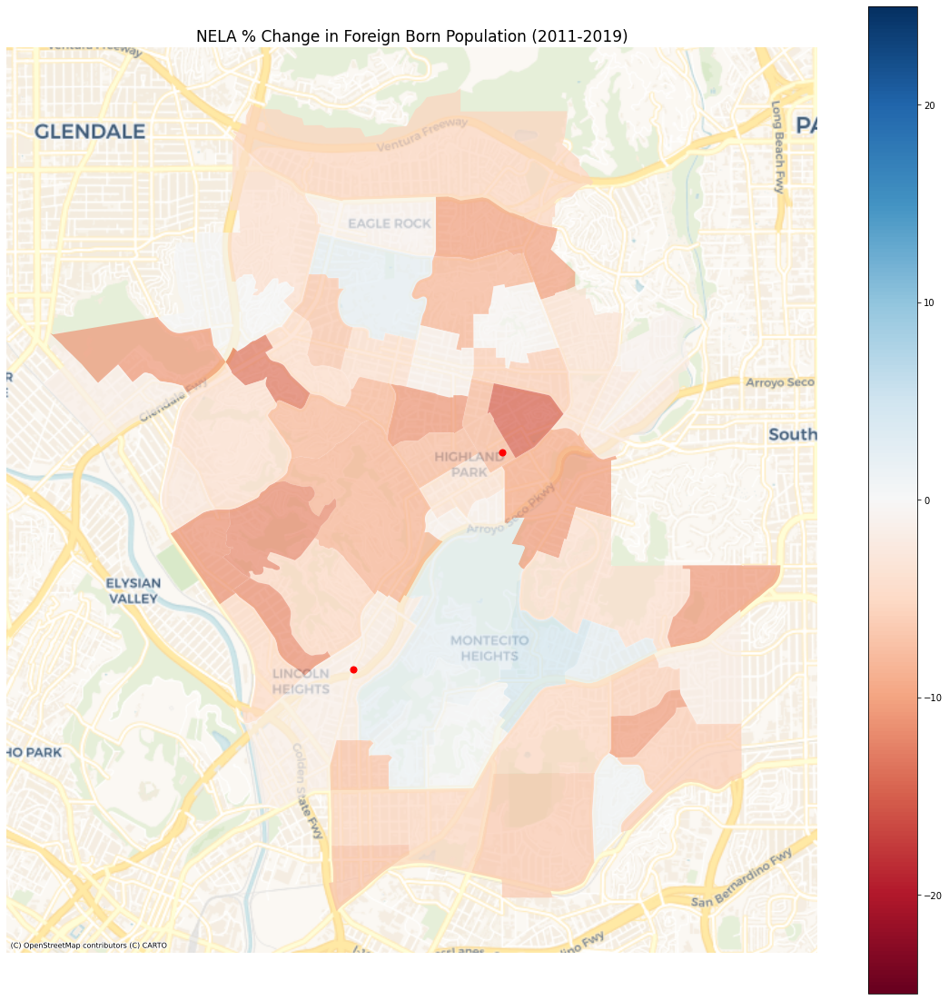

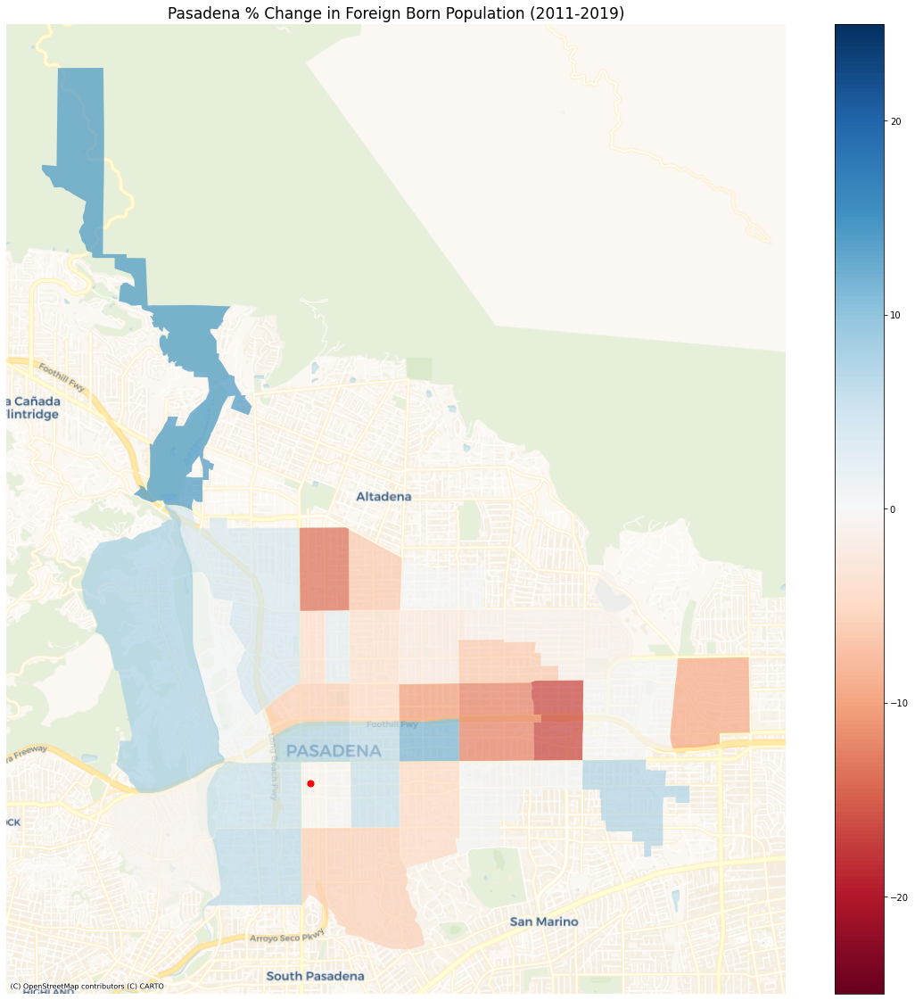

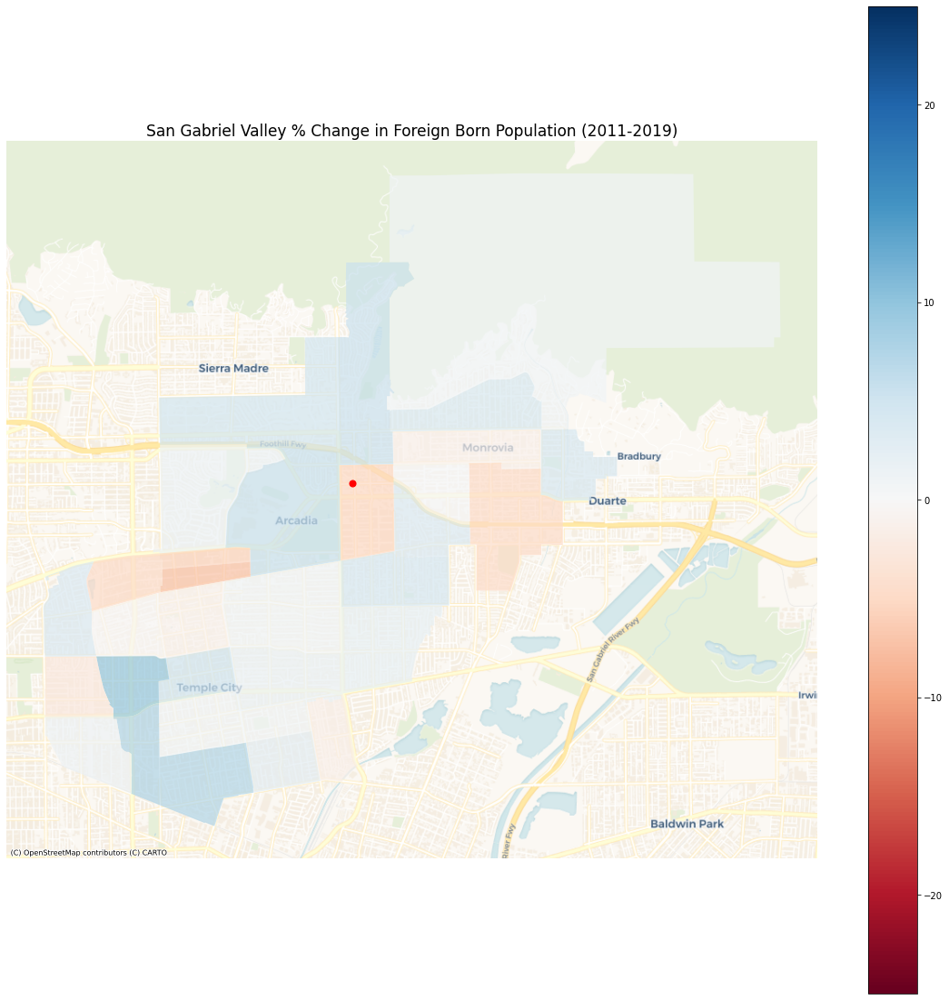

In [44]:
for region in regions:
    rgn_map(region = region)

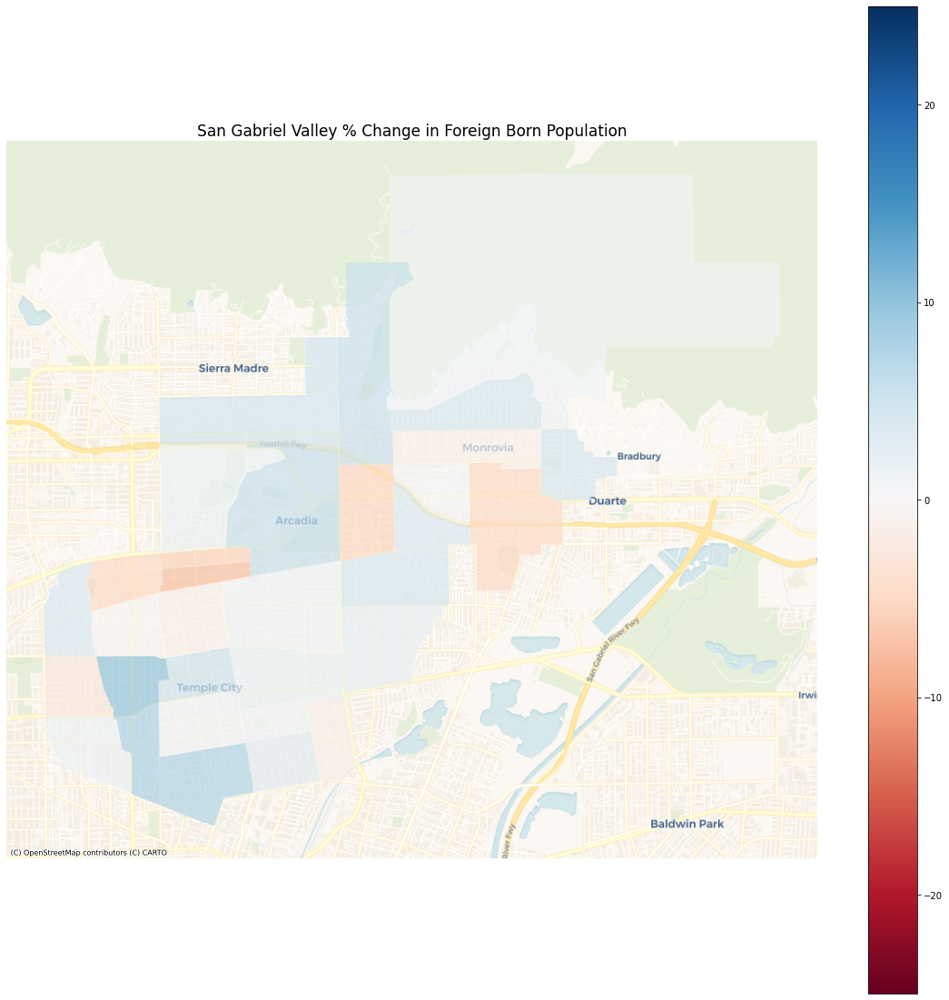

In [45]:
rgn_map()

plt.savefig("NSGV_ForeignBorn.jpg")

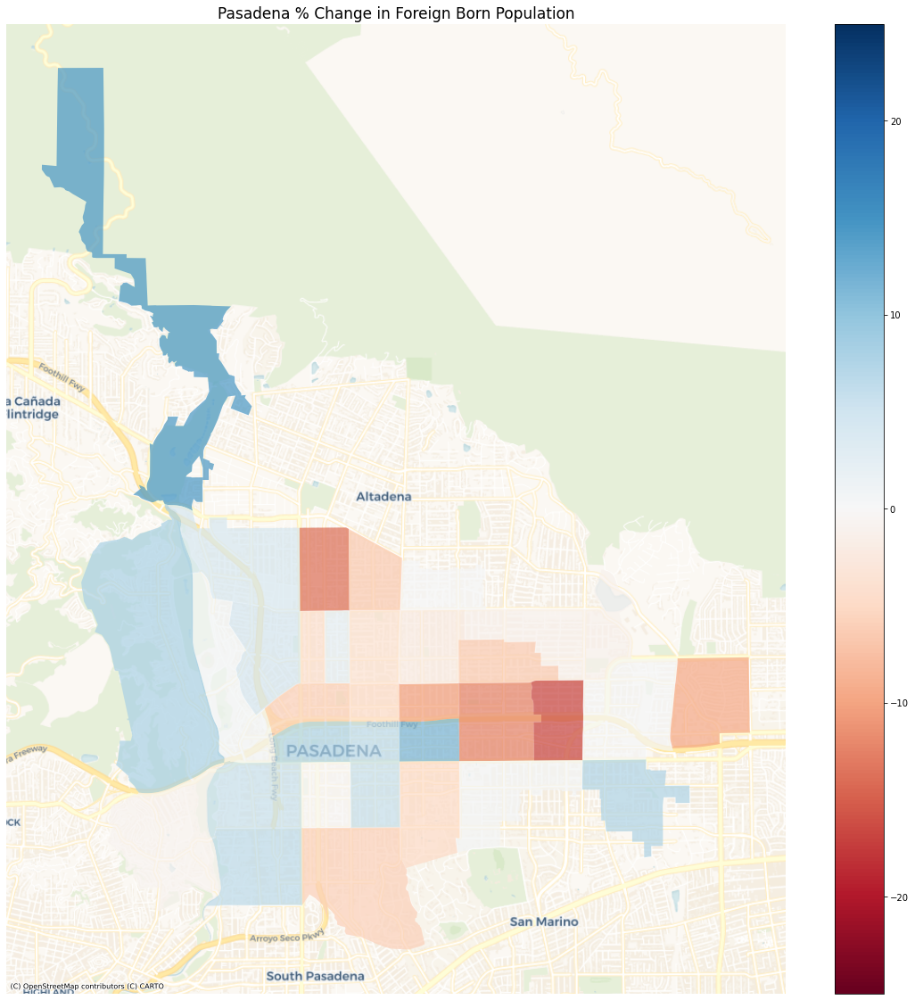

In [46]:
g_map(region='Pasadena')

plt.savefig("Pasadena_ForeignBorn.jpg")

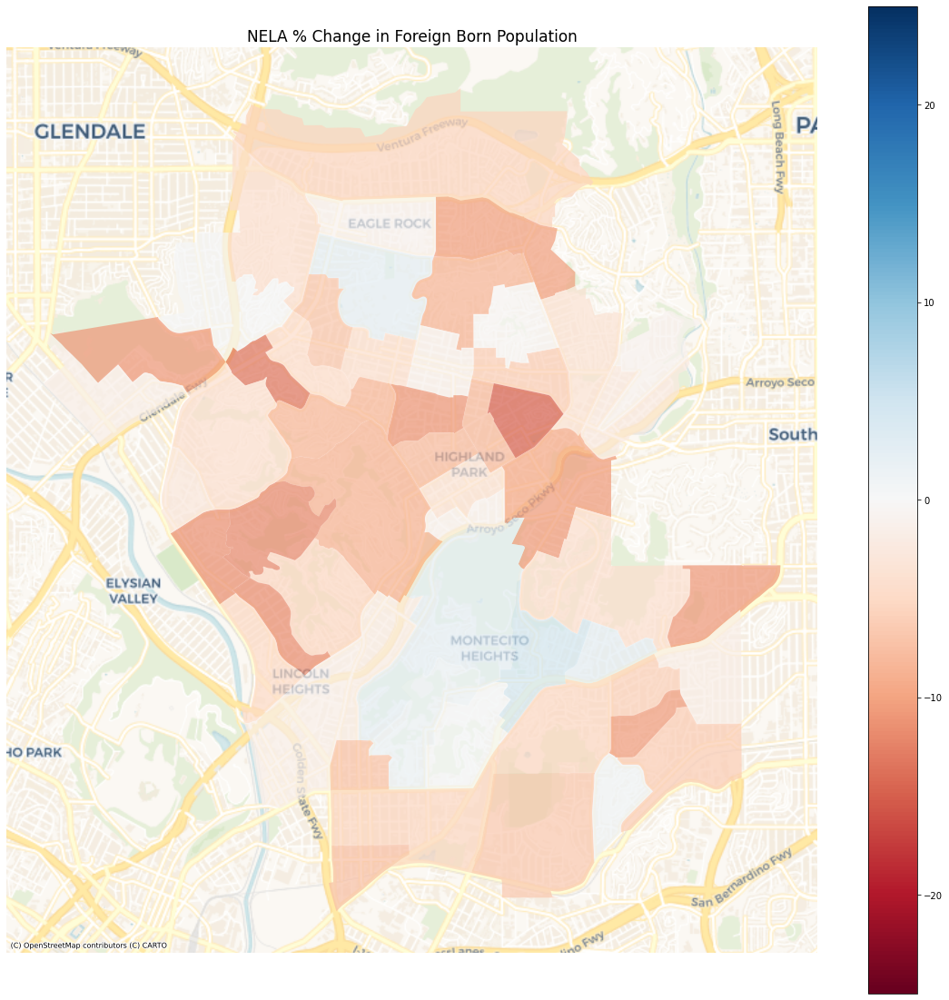

In [47]:
stn_map(region='NELA')

plt.savefig("NELA_ForeignBorn.jpg")

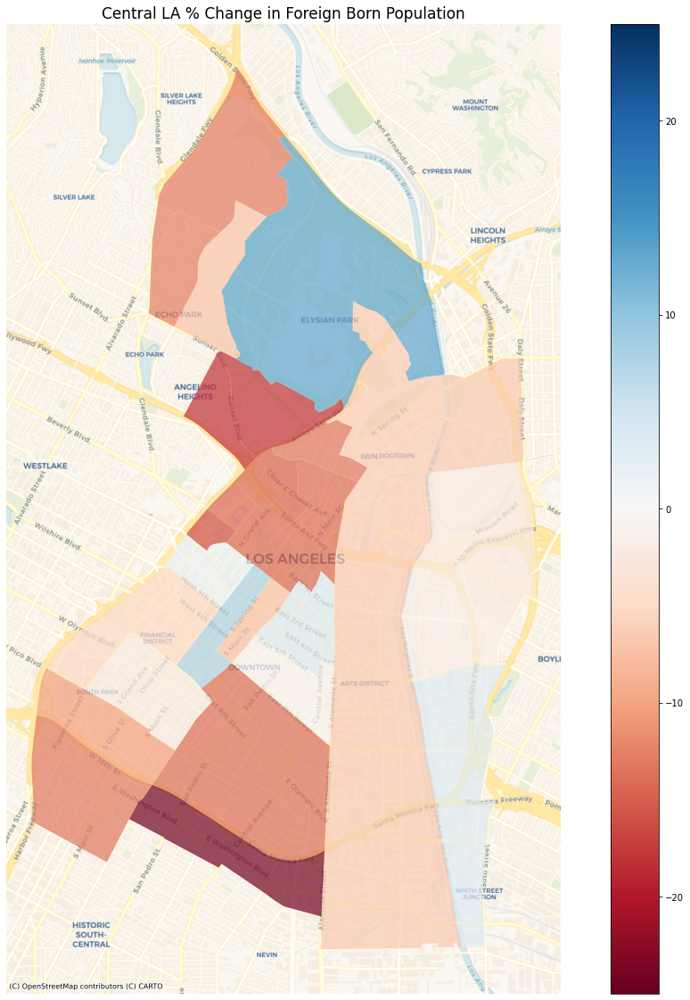

In [48]:
stn_map(region='Central LA')

plt.savefig("Central_LA_ForeignBorn.jpg")

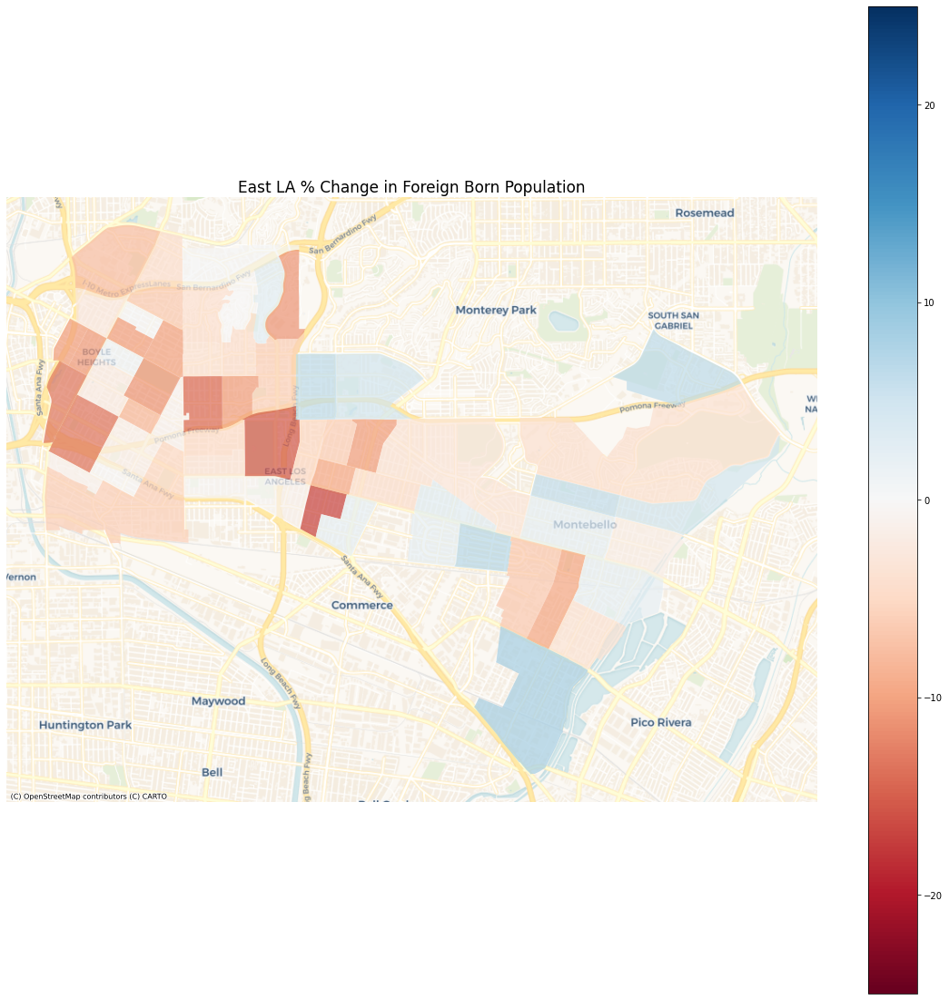

In [49]:
stn_map(region='East LA')

plt.savefig("East_LA_ForeignBorn.jpg")